# Student Stress Factors

Data: [Student Stress Factors: A Comprehensive Analysis
](https://www.kaggle.com/datasets/rxnach/student-stress-factors-a-comprehensive-analysis)

> The features are selected scientifically considering 5 major factors, they are Psychological, Physiological, Social, Environmental, and Academic Factors.
> 
> **Psychological Factors** => 'anxiety_level', 'self_esteem', 'mental_health_history', 'depression'
> 
> **Physiological Factors** => 'headache', 'blood_pressure', 'sleep_quality', 'breathing_problem'
> 
> **Environmental Factors** => 'noise_level', 'living_conditions', 'safety', 'basic_needs'
> 
> **Academic Factors** => 'academic_performance', 'study_load', 'teacher_student_relationship', 'future_career_concerns'
> 
> **Social Factor** => 'social_support', 'peer_pressure', 'extracurricular_activities', 'bullying'

## Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.decomposition import FactorAnalysis, PCA
from sklearn.preprocessing import StandardScaler

from factor_analyzer.factor_analyzer import calculate_kmo, calculate_bartlett_sphericity
from factor_analyzer import FactorAnalyzer

In [2]:
sns.set_context('paper')

## Factor Analysis

In [3]:
data = pd.read_csv('data/StressLevelDataset.csv')
data

,anxiety_level,self_esteem,mental_health_history,depression,headache,blood_pressure,sleep_quality,breathing_problem,noise_level,living_conditions,...,basic_needs,academic_performance,study_load,teacher_student_relationship,future_career_concerns,social_support,peer_pressure,extracurricular_activities,bullying,stress_level
0,14,20,0,11,2,1,2,4,2,3,...,2,3,2,3,3,2,3,3,2,1
1,15,8,1,15,5,3,1,4,3,1,...,2,1,4,1,5,1,4,5,5,2
2,12,18,1,14,2,1,2,2,2,2,...,2,2,3,3,2,2,3,2,2,1
3,16,12,1,15,4,3,1,3,4,2,...,2,2,4,1,4,1,4,4,5,2
4,16,28,0,7,2,3,5,1,3,2,...,3,4,3,1,2,1,5,0,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,11,17,0,14,3,1,3,2,2,2,...,3,2,2,2,3,3,2,3,3,1
1096,9,12,0,8,0,3,0,0,0,1,...,4,0,1,1,1,1,3,4,3,2
1097,4,26,0,3,1,2,5,2,2,3,...,4,5,1,4,1,3,1,2,1,0
1098,21,0,1,19,5,3,1,4,3,1,...,1,2,5,1,4,1,4,4,4,2


In [4]:
psychological_factors = ['anxiety_level', 'self_esteem', 'mental_health_history', 'depression']
physiological_factors = ['headache', 'blood_pressure', 'sleep_quality', 'breathing_problem']
environmental_factors = ['noise_level', 'living_conditions', 'safety', 'basic_needs']
academic_factors = ['academic_performance', 'study_load', 'teacher_student_relationship', 'future_career_concerns']
social_factors = ['social_support', 'peer_pressure', 'extracurricular_activities', 'bullying']

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1100 entries, 0 to 1099
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype
---  ------                        --------------  -----
 0   anxiety_level                 1100 non-null   int64
 1   self_esteem                   1100 non-null   int64
 2   mental_health_history         1100 non-null   int64
 3   depression                    1100 non-null   int64
 4   headache                      1100 non-null   int64
 5   blood_pressure                1100 non-null   int64
 6   sleep_quality                 1100 non-null   int64
 7   breathing_problem             1100 non-null   int64
 8   noise_level                   1100 non-null   int64
 9   living_conditions             1100 non-null   int64
 10  safety                        1100 non-null   int64
 11  basic_needs                   1100 non-null   int64
 12  academic_performance          1100 non-null   int64
 13  study_load                    110

In [6]:
data.describe()

,anxiety_level,self_esteem,mental_health_history,depression,headache,blood_pressure,sleep_quality,breathing_problem,noise_level,living_conditions,...,basic_needs,academic_performance,study_load,teacher_student_relationship,future_career_concerns,social_support,peer_pressure,extracurricular_activities,bullying,stress_level
count,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,...,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000
mean,11.063636,17.777273,0.492727,12.555455,2.508182,2.181818,2.660000,2.753636,2.649091,2.518182,...,2.772727,2.772727,2.621818,2.648182,2.649091,1.881818,2.734545,2.767273,2.617273,0.996364
std,6.117558,8.944599,0.500175,7.727008,1.409356,0.833575,1.548383,1.400713,1.328127,1.119208,...,1.433761,1.414594,1.315781,1.384579,1.529375,1.047826,1.425265,1.417562,1.530958,0.821673
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.000000,11.000000,0.000000,6.000000,1.000000,1.000000,1.000000,2.000000,2.000000,2.000000,...,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,2.000000,1.000000,0.000000
50%,11.000000,19.000000,0.000000,12.000000,3.000000,2.000000,2.500000,3.000000,3.000000,2.000000,...,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.500000,3.000000,1.000000
75%,16.000000,26.000000,1.000000,19.000000,3.000000,3.000000,4.000000,4.000000,3.000000,3.000000,...,4.000000,4.000000,3.000000,4.000000,4.000000,3.000000,4.000000,4.000000,4.000000,2.000000
max,21.000000,30.000000,1.000000,27.000000,5.000000,3.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,3.000000,5.000000,5.000000,5.000000,2.000000


In [7]:
data.corr()

,anxiety_level,self_esteem,mental_health_history,depression,headache,blood_pressure,sleep_quality,breathing_problem,noise_level,living_conditions,...,basic_needs,academic_performance,study_load,teacher_student_relationship,future_career_concerns,social_support,peer_pressure,extracurricular_activities,bullying,stress_level
anxiety_level,1.000000,-0.672745,0.634450,0.694340,0.632738,0.330867,-0.710292,0.561654,0.608624,-0.568434,...,-0.637079,-0.649601,0.586064,-0.663176,0.717016,-0.569748,0.642910,0.641022,0.709982,0.736795
self_esteem,-0.672745,1.000000,-0.603502,-0.699602,-0.626058,-0.514692,0.662693,-0.510514,-0.571169,0.550535,...,0.631212,0.639045,-0.575112,0.652934,-0.712520,0.679211,-0.607118,-0.641202,-0.640737,-0.756195
mental_health_history,0.634450,-0.603502,1.000000,0.615882,0.604826,0.295617,-0.614146,0.464347,0.515290,-0.508525,...,-0.601196,-0.586193,0.532267,-0.587728,0.625909,-0.482560,0.580602,0.554576,0.624366,0.648644
depression,0.694340,-0.699602,0.615882,1.000000,0.657700,0.436084,-0.693161,0.522540,0.566250,-0.530351,...,-0.608776,-0.633174,0.602498,-0.673853,0.706561,-0.617972,0.635544,0.648551,0.665790,0.734379
headache,0.632738,-0.626058,0.604826,0.657700,1.000000,0.361986,-0.638771,0.461719,0.543557,-0.532825,...,-0.623199,-0.622059,0.542890,-0.625928,0.679307,-0.572988,0.622581,0.582562,0.609775,0.713484
blood_pressure,0.330867,-0.514692,0.295617,0.436084,0.361986,1.000000,-0.300323,0.162308,0.352744,-0.274686,...,-0.280590,-0.262785,0.348964,-0.352123,0.434087,-0.752531,0.401392,0.426254,0.370440,0.394200
sleep_quality,-0.710292,0.662693,-0.614146,-0.693161,-0.638771,-0.300323,1.000000,-0.541687,-0.576645,0.535462,...,0.620955,0.671326,-0.551775,0.677569,-0.682130,0.554553,-0.649098,-0.623092,-0.699427,-0.749068
breathing_problem,0.561654,-0.510514,0.464347,0.522540,0.461719,0.162308,-0.541687,1.000000,0.459235,-0.448997,...,-0.508172,-0.507251,0.428791,-0.498895,0.545345,-0.365173,0.492729,0.516884,0.576341,0.573984
noise_level,0.608624,-0.571169,0.515290,0.566250,0.543557,0.352744,-0.576645,0.459235,1.000000,-0.452362,...,-0.572327,-0.513730,0.493625,-0.538758,0.575439,-0.492094,0.583817,0.563614,0.585458,0.663371
living_conditions,-0.568434,0.550535,-0.508525,-0.530351,-0.532825,-0.274686,0.535462,-0.448997,-0.452362,1.000000,...,0.503275,0.507221,-0.437732,0.549332,-0.565071,0.466594,-0.501795,-0.515794,-0.551139,-0.581723


[]

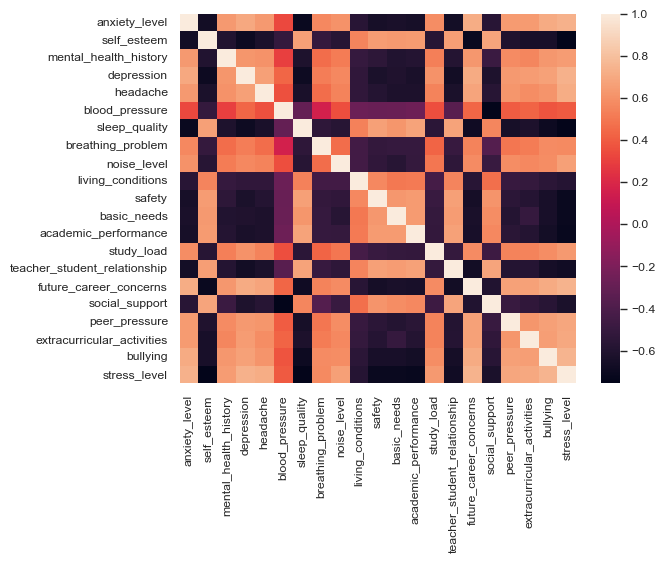

In [8]:
sns.heatmap(data.corr())
plt.plot()

[]

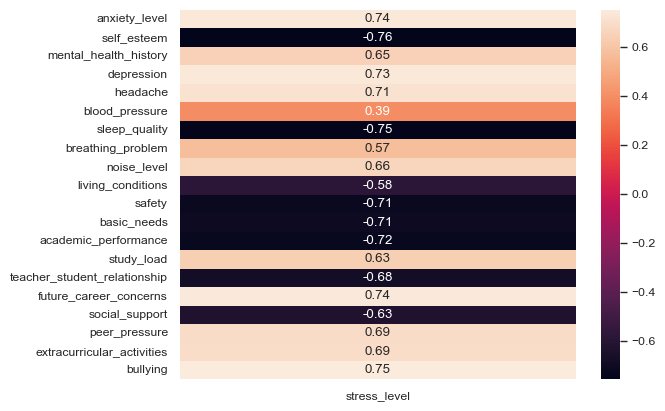

In [9]:
sns.heatmap(data.corr().iloc[:-1,-1:], annot = True)
plt.plot()

In [10]:
stress = data['stress_level']

In [11]:
data = data.drop(columns=['stress_level'], axis=1)

### Bartlett’s test

> Bartlett's test (Snedecor and Cochran, 1983) is used to test if k samples have equal variances.

In [12]:
chi_square_value,p_value=calculate_bartlett_sphericity(data)
chi_square_value, p_value

(17505.867455555795, 0.0)

### Kaiser-Meyer-Olkin (KMO) Test

>  The statistic is a measure of the proportion of variance among variables that might be common variance. The lower the proportion, the more suited your data is to Factor Analysis.

Kaiser Scale:
0.00 to 0.49 unacceptable
0.50 to 0.59 miserable
0.60 to 0.69 mediocre
0.70 to 0.79 middling
0.80 to 0.89 meritorious
0.90 to 1.00 marvelous

In [13]:
kmo_all,kmo_model=calculate_kmo(data)

In [14]:
kmo_model

0.9683847468852266

In [15]:
scaled_data = StandardScaler().fit_transform(data)
scaled_data

array([[ 0.48020782,  0.24861241, -0.98555881, ...,  0.18633396,
         0.16424895, -0.40337716],
       [ 0.64374608, -1.09358954,  1.0146528 , ...,  0.88827696,
         1.57576339,  1.5570715 ],
       [ 0.15313129,  0.02491208,  1.0146528 , ...,  0.18633396,
        -0.54150826, -0.40337716],
       ...,
       [-1.15517484,  0.91971338, -0.98555881, ..., -1.21755204,
        -0.54150826, -1.05686005],
       [ 1.62497568, -1.98839084,  1.0146528 , ...,  0.88827696,
         0.87000617,  0.90358861],
       [ 1.13436088, -1.31728986,  1.0146528 , ...,  1.59021996,
        -1.24726548,  0.90358861]])

### 5 Factors

In [16]:
factor_analysis = FactorAnalysis(5, rotation='varimax', random_state=13)

In [17]:
factor_analysis.fit(data)

FactorAnalysis(n_components=5, random_state=13, rotation='varimax')

In [18]:
factor_analysis.components_

array([[ 4.04066023e+00, -8.87858200e+00,  2.97443329e-01,
         5.24441073e+00,  8.68581759e-01,  4.28683124e-01,
        -1.00912264e+00,  7.04085321e-01,  7.48681739e-01,
        -6.08678275e-01, -8.93482788e-01, -8.92950677e-01,
        -8.90919293e-01,  7.45632040e-01, -8.89239900e-01,
         1.07610657e+00, -7.05994520e-01,  8.52298708e-01,
         8.97450418e-01,  9.65262023e-01],
       [-1.60066638e+00,  3.03042118e-01, -1.32875087e-01,
        -5.54112999e+00, -4.33647517e-01, -1.07600789e-01,
         4.86579956e-01, -3.11122230e-01, -2.99200575e-01,
         2.19984478e-01,  3.36401244e-01,  3.27116609e-01,
         3.61753099e-01, -3.68062561e-01,  4.16680690e-01,
        -4.40956034e-01,  2.19494442e-01, -4.15007106e-01,
        -3.96294868e-01, -4.49461239e-01],
       [-4.17995922e+00,  9.93903111e-02, -1.25306999e-01,
        -6.52563065e-01, -2.96600009e-01,  4.94781378e-02,
         4.44233202e-01, -3.51045361e-01, -3.44927368e-01,
         2.56402107e-01,  3.4

In [19]:
factor_analysis.noise_variance_

array([1.02421732, 1.00017231, 0.11223466, 1.01563737, 0.78205473,
       0.14825112, 0.73653372, 1.08967466, 0.91178921, 0.69274032,
       0.72076737, 0.76996431, 0.70419514, 0.92991003, 0.60971101,
       0.69180555, 0.15793036, 0.87725652, 0.87257514, 0.72356473])

In [20]:
factor_df = pd.DataFrame(
    factor_analysis.components_.T, 
    columns=['factor_' + str(i) for i in range(factor_analysis.components_.shape[0])], 
    index=list(data.columns)
)

factor_df

,factor_0,factor_1,factor_2,factor_3,factor_4
anxiety_level,4.040660,-1.600666,-4.179959,0.002506,0.025634
self_esteem,-8.878582,0.303042,0.099390,-0.010111,-0.039436
mental_health_history,0.297443,-0.132875,-0.125307,-0.016023,0.125102
depression,5.244411,-5.541130,-0.652563,0.004430,0.021662
headache,0.868582,-0.433648,-0.296600,0.083762,0.407731
blood_pressure,0.428683,-0.107601,0.049478,0.584677,-0.086258
sleep_quality,-1.009123,0.486580,0.444233,0.060900,-0.449016
breathing_problem,0.704085,-0.311122,-0.351045,-0.182051,0.346641
noise_level,0.748682,-0.299201,-0.344927,0.079076,0.272190
living_conditions,-0.608678,0.219984,0.256402,-0.008771,-0.271825


[]

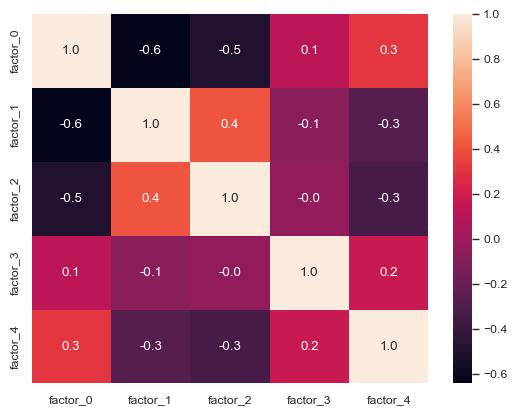

In [21]:
sns.heatmap(factor_df.corr(), annot=True, fmt=".1f")
plt.plot()

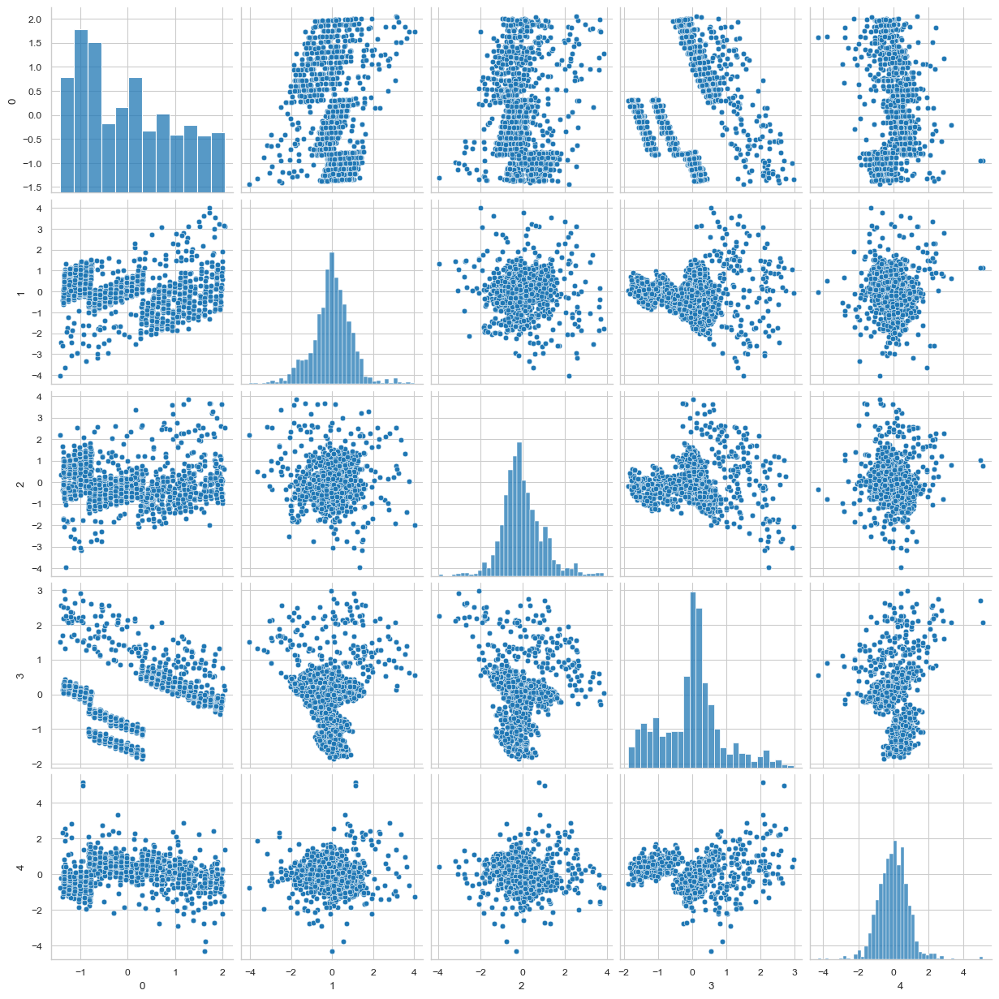

In [22]:
factor_scores = factor_analysis.transform(data)
sns.pairplot(pd.DataFrame(factor_scores))

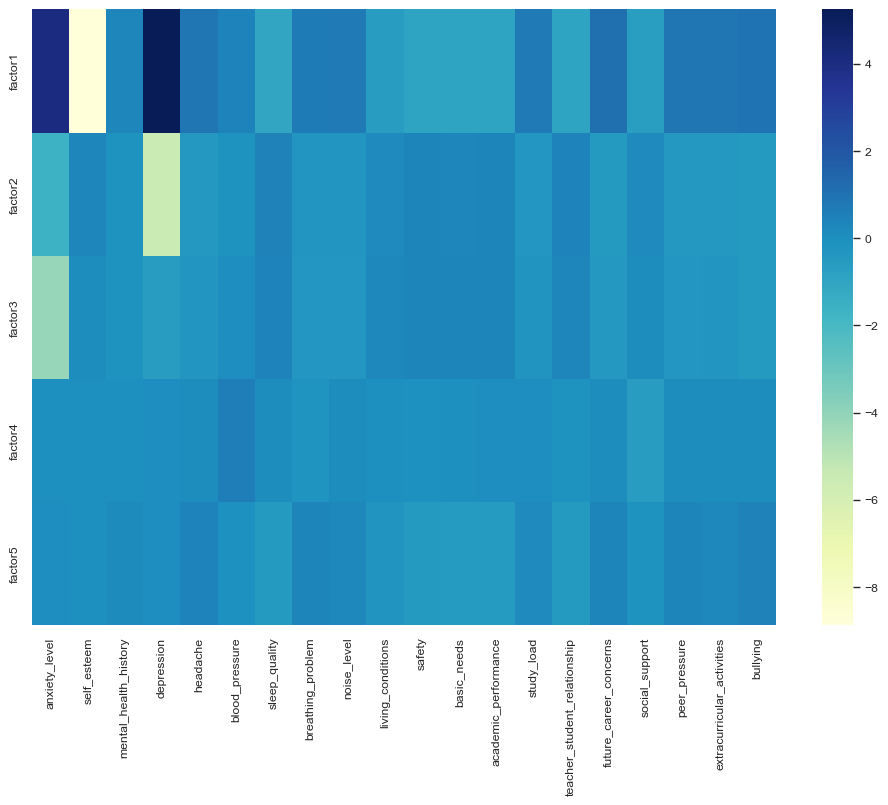

In [23]:
plt.figure(figsize=(12, 8))

sns.heatmap(factor_analysis.components_,
            cmap='YlGnBu',
            yticklabels=["factor" + str(x) for x in range(1, 6)],
            xticklabels=data.columns.tolist(),
            cbar_kws={"orientation": "vertical"}
            )
plt.show()

### 5 Factors with Standardization 

In [24]:
factor_analysis = FactorAnalysis(5, rotation='varimax', random_state=13)

In [25]:
factor_analysis.fit(scaled_data)

FactorAnalysis(n_components=5, random_state=13, rotation='varimax')

In [26]:
factor_analysis.components_

array([[ 4.97369513e-01, -4.63415945e-01,  4.03967568e-01,
         4.55341143e-01,  4.67897854e-01,  2.34032373e-02,
        -5.29501638e-01,  3.95900732e-01,  3.31606481e-01,
        -4.30910281e-01, -6.54234376e-01, -5.93334961e-01,
        -6.11923663e-01,  3.11309817e-01, -6.75595349e-01,
         4.41870094e-01, -5.61096090e-01,  2.82057138e-01,
         3.13562472e-01,  4.58428187e-01],
       [ 2.23722160e-01, -4.30684609e-01,  1.89762110e-01,
         3.38057432e-01,  2.71163815e-01,  9.23491618e-01,
        -1.91887076e-01,  6.13298708e-02,  2.60974377e-01,
        -1.89634146e-01, -2.17015748e-01, -1.98359565e-01,
        -1.73978369e-01,  2.58084078e-01, -2.88932053e-01,
         3.22256243e-01, -7.59639941e-01,  2.77725826e-01,
         3.21070322e-01,  2.53781078e-01],
       [-6.30139327e-01,  5.36257457e-01, -5.59913167e-01,
        -6.07372680e-01, -5.35747905e-01, -1.81868474e-01,
         6.04419774e-01, -5.37906197e-01, -5.37489310e-01,
         4.74976617e-01,  4.4

In [27]:
factor_analysis.noise_variance_

array([0.28866004, 0.30236169, 0.41588579, 0.28623876, 0.36647709,
       0.1190191 , 0.30279507, 0.52320254, 0.46943983, 0.55206297,
       0.32088473, 0.27389994, 0.34794912, 0.50405711, 0.28166546,
       0.27436477, 0.07809792, 0.34502984, 0.33874511, 0.28323223])

In [28]:
factor_df = pd.DataFrame(
    factor_analysis.components_.T, 
    columns=['factor_' + str(i) for i in range(factor_analysis.components_.shape[0])], 
    index=list(data.columns)
)

factor_df

,factor_0,factor_1,factor_2,factor_3,factor_4
anxiety_level,0.497370,0.223722,-0.630139,0.125216,-0.019856
self_esteem,-0.463416,-0.430685,0.536257,-0.080766,-0.035767
mental_health_history,0.403968,0.189762,-0.559913,0.255384,0.120383
depression,0.455341,0.338057,-0.607373,0.046565,0.143489
headache,0.467898,0.271164,-0.535748,0.150244,0.187926
blood_pressure,0.023403,0.923492,-0.181868,0.030603,0.004965
sleep_quality,-0.529502,-0.191887,0.604420,-0.103950,-0.027136
breathing_problem,0.395901,0.061330,-0.537906,0.072021,-0.167310
noise_level,0.331606,0.260974,-0.537489,0.235331,-0.059354
living_conditions,-0.430910,-0.189634,0.474977,-0.041332,0.006742


[]

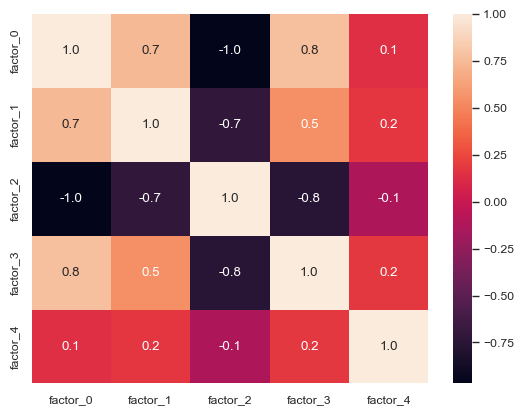

In [29]:
sns.heatmap(factor_df.corr(), annot=True, fmt=".1f")
plt.plot()

D:\Work\Uni\FMI-multivariate-statistical-modeling\Stress-Factors\venv\lib\site-packages\sklearn\base.py:458: UserWarning: X has feature names, but FactorAnalysis was fitted without feature names
  warnings.warn(


[]

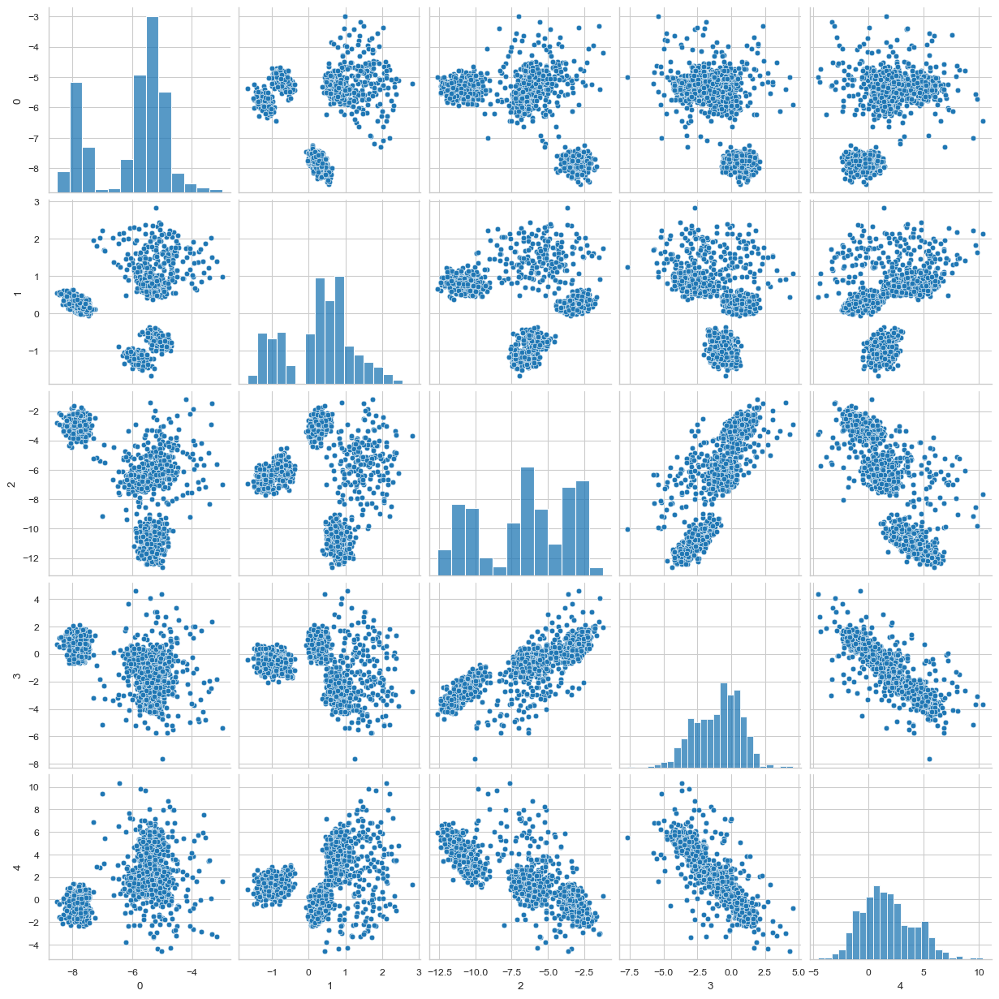

In [30]:
factor_scores = factor_analysis.transform(data)
sns.pairplot(pd.DataFrame(factor_scores))
plt.plot()

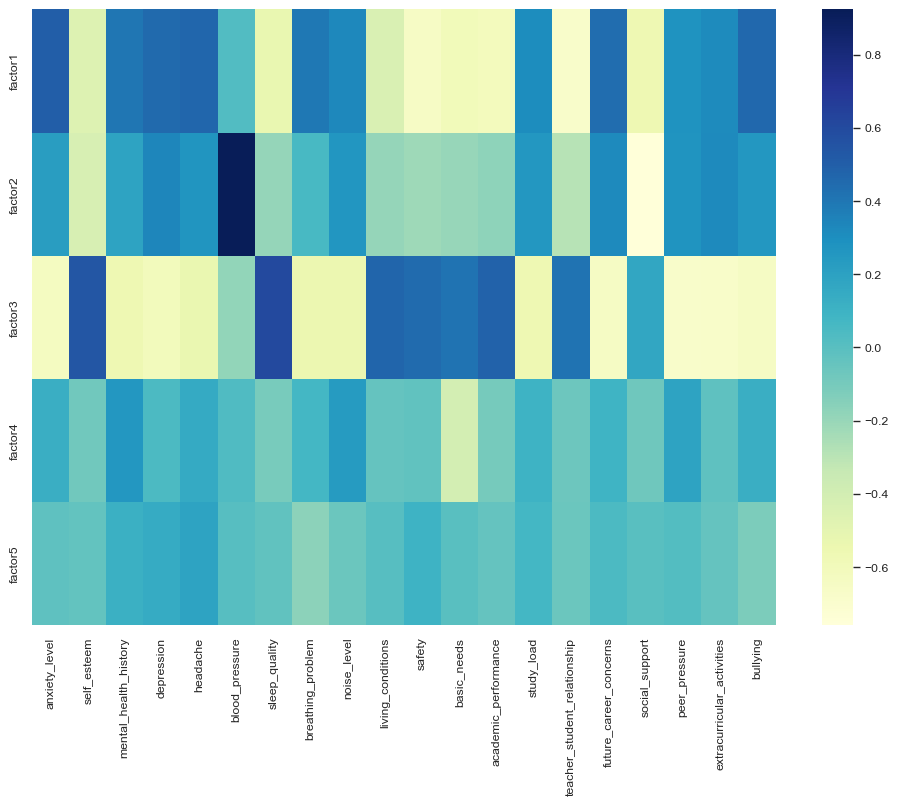

In [31]:
plt.figure(figsize=(12, 8))

sns.heatmap(factor_analysis.components_,
            cmap='YlGnBu',
            yticklabels=["factor" + str(x) for x in range(1, 6)],
            xticklabels=data.columns.tolist(),
            cbar_kws={"orientation": "vertical"}
            )
plt.show()

### 4 Factors

In [32]:
factor_analysis = FactorAnalysis(4, random_state=13)

In [33]:
factor_analysis.fit(data)

FactorAnalysis(n_components=4, random_state=13)

In [34]:
factor_analysis.components_

array([[ 5.11473076, -8.22366216,  0.35018373,  6.85910917,  1.02805176,
         0.42039152, -1.20513543,  0.83931644,  0.87487657, -0.69966493,
        -1.02785666, -1.02618807, -1.03456593,  0.87511612, -1.04790483,
         1.23822222, -0.75515704,  1.0175146 ,  1.03756097,  1.16552045],
       [-1.18768844, -3.31172449, -0.04022166, -2.76732282, -0.13181112,
         0.10486455,  0.17373183, -0.11416927, -0.07977441,  0.03866305,
         0.05750944,  0.05199068,  0.08078717, -0.10885218,  0.11681139,
        -0.086813  , -0.06244588, -0.1443619 , -0.08953591, -0.17656598],
       [-2.91566339, -0.50753096, -0.0544991 ,  1.96541733, -0.07980363,
         0.11745284,  0.18817063, -0.18424526, -0.17436468,  0.13326771,
         0.16207806,  0.17080643,  0.15324405, -0.06899535,  0.10560889,
        -0.15136923, -0.02505378, -0.14431932, -0.09733504, -0.24841021],
       [-0.55253013,  0.24055276,  0.10228096, -0.27871265,  0.3605983 ,
         0.01589993, -0.34473477,  0.25208746,  

In [35]:
factor_analysis.noise_variance_

array([1.01015452, 1.01695848, 0.11223816, 1.00506362, 0.77383734,
       0.49242376, 0.75729459, 1.14422077, 0.8984637 , 0.69263069,
       0.75308383, 0.79860322, 0.74420124, 0.92058535, 0.65549744,
       0.67082603, 0.49387965, 0.83789969, 0.85329397, 0.69482869])

In [36]:
factor_df = pd.DataFrame(
    factor_analysis.components_.T, 
    columns=['factor_' + str(i) for i in range(factor_analysis.components_.shape[0])], 
    index=list(data.columns)
)

factor_df

,factor_0,factor_1,factor_2,factor_3
anxiety_level,5.114731,-1.187688,-2.915663,-0.552530
self_esteem,-8.223662,-3.311724,-0.507531,0.240553
mental_health_history,0.350184,-0.040222,-0.054499,0.102281
depression,6.859109,-2.767323,1.965417,-0.278713
headache,1.028052,-0.131811,-0.079804,0.360598
blood_pressure,0.420392,0.104865,0.117453,0.015900
sleep_quality,-1.205135,0.173732,0.188171,-0.344735
breathing_problem,0.839316,-0.114169,-0.184245,0.252087
noise_level,0.874877,-0.079774,-0.174365,0.248773
living_conditions,-0.699665,0.038663,0.133268,-0.224055


[]

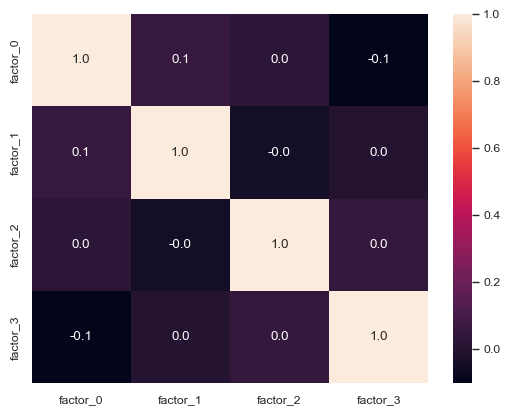

In [37]:
sns.heatmap(factor_df.corr(), annot=True, fmt=".1f")
plt.plot()

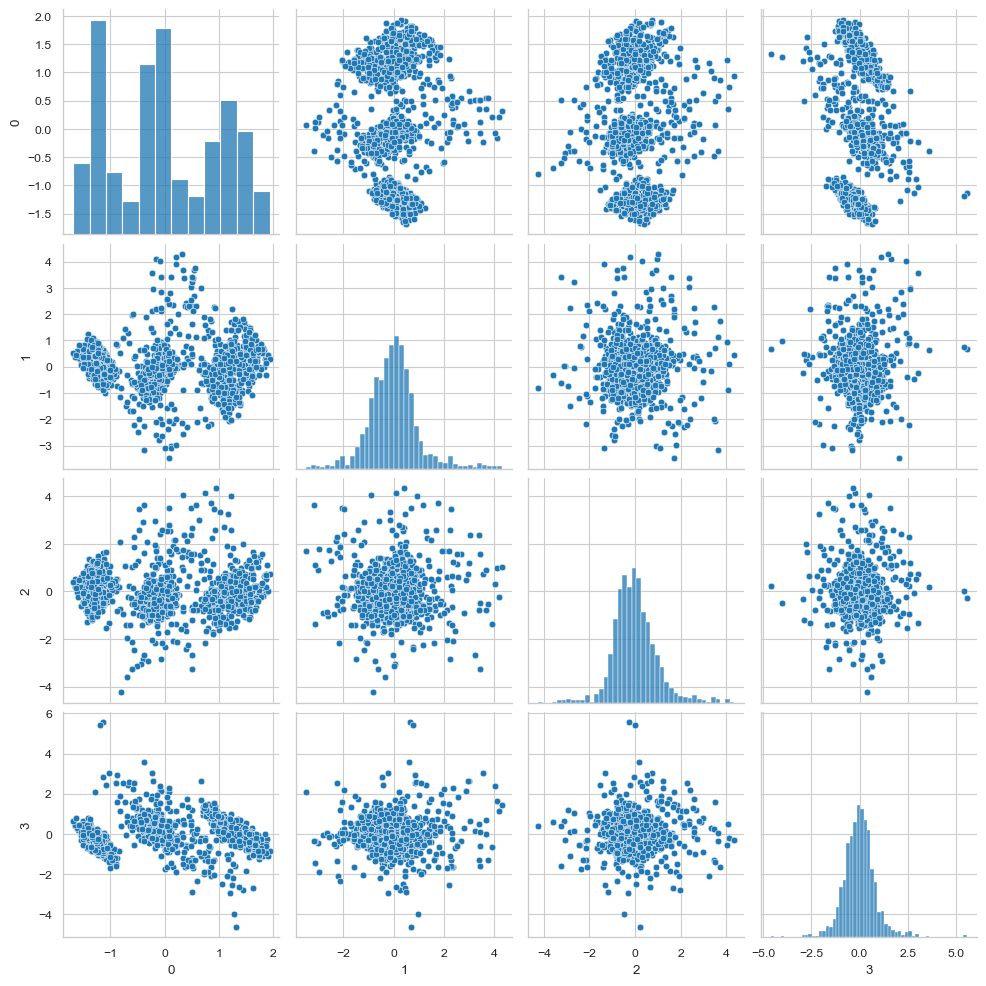

In [38]:
factor_scores = factor_analysis.transform(data)
sns.pairplot(pd.DataFrame(factor_scores))

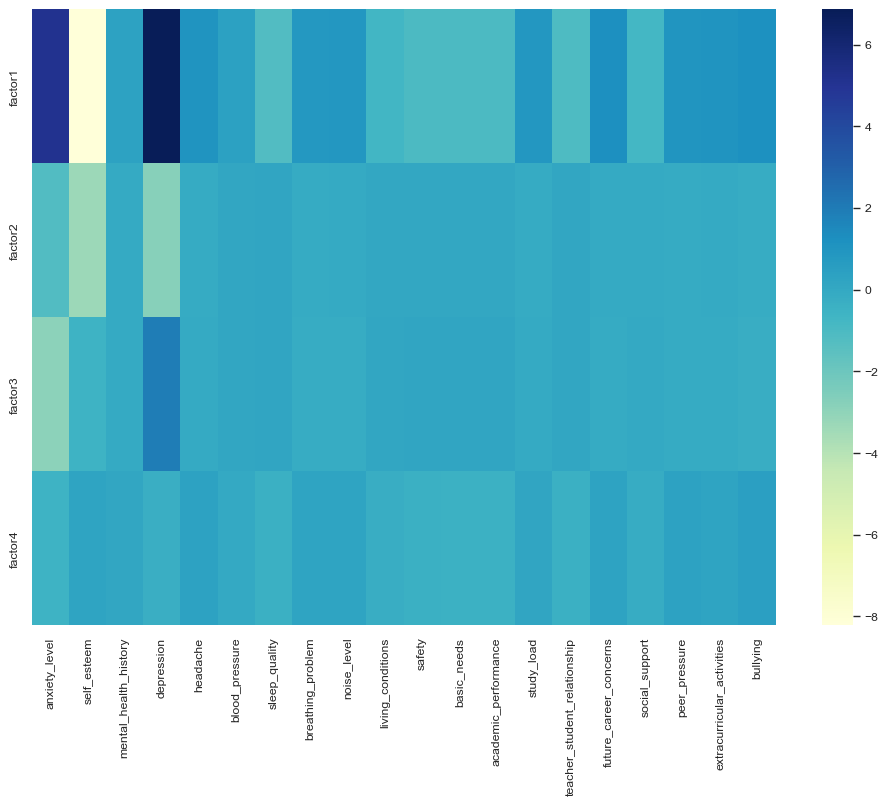

In [39]:
plt.figure(figsize=(12, 8))

sns.heatmap(factor_analysis.components_,
            cmap='YlGnBu',
            yticklabels=["factor" + str(x) for x in range(1, 5)],
            xticklabels=data.columns.tolist(),
            cbar_kws={"orientation": "vertical"}
            )
plt.show()

### 4 Factors with Standardization

In [40]:
factor_analysis = FactorAnalysis(4, random_state=13)

In [41]:
factor_analysis.fit(scaled_data)

FactorAnalysis(n_components=4, random_state=13)

In [42]:
factor_analysis.components_

array([[ 0.78034364, -0.82624336,  0.68622008,  0.8020639 ,  0.74523406,
         0.66615992, -0.76380582,  0.5654828 ,  0.66875154, -0.62607744,
        -0.75045973, -0.73663527, -0.73512341,  0.6516015 , -0.7963    ,
         0.81152845, -0.87829983,  0.72214213,  0.73427784,  0.78000283],
       [-0.31168697,  0.08546427, -0.28827565, -0.18823745, -0.2197421 ,
         0.63750434,  0.33091904, -0.3530677 , -0.1957416 ,  0.22948643,
         0.25673571,  0.27750814,  0.30803904, -0.18895574,  0.19628116,
        -0.22204185, -0.34230741, -0.2347885 , -0.18420133, -0.27937561],
       [-0.05877985,  0.06301931, -0.08300102, -0.09595636, -0.03518613,
        -0.23788406,  0.01919616, -0.05310717, -0.1247783 ,  0.01144938,
        -0.1709752 , -0.14883715, -0.11818764, -0.15968618, -0.19504628,
        -0.13353266, -0.22284044, -0.2618475 , -0.2368191 , -0.10163232],
       [ 0.02711894, -0.00805614, -0.11679563,  0.06629442, -0.11176858,
        -0.01346903, -0.04427333,  0.05411491, -

In [43]:
factor_analysis.noise_variance_

array([0.28897065, 0.30584552, 0.42707445, 0.31036195, 0.38576304,
       0.09594956, 0.30360842, 0.54702818, 0.49016995, 0.55026146,
       0.3295633 , 0.28957209, 0.34990228, 0.51337689, 0.28797882,
       0.27405308, 0.06352082, 0.3453623 , 0.33869895, 0.30322308])

In [44]:
factor_df = pd.DataFrame(
    factor_analysis.components_.T, 
    columns=['factor_' + str(i) for i in range(factor_analysis.components_.shape[0])], 
    index=list(data.columns)
)

factor_df

,factor_0,factor_1,factor_2,factor_3
anxiety_level,0.780344,-0.311687,-0.058780,0.027119
self_esteem,-0.826243,0.085464,0.063019,-0.008056
mental_health_history,0.686220,-0.288276,-0.083001,-0.116796
depression,0.802064,-0.188237,-0.095956,0.066294
headache,0.745234,-0.219742,-0.035186,-0.111769
blood_pressure,0.666160,0.637504,-0.237884,-0.013469
sleep_quality,-0.763806,0.330919,0.019196,-0.044273
breathing_problem,0.565483,-0.353068,-0.053107,0.054115
noise_level,0.668752,-0.195742,-0.124778,-0.078377
living_conditions,-0.626077,0.229486,0.011449,-0.050787


[]

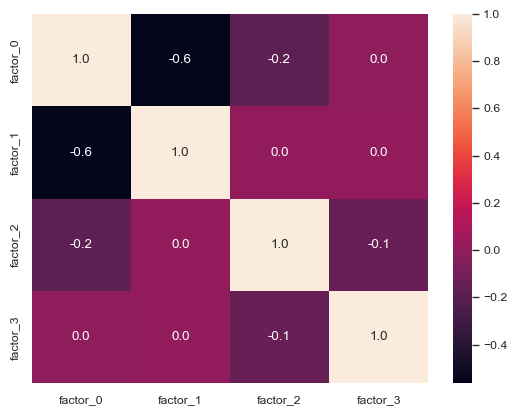

In [45]:
sns.heatmap(factor_df.corr(), annot=True, fmt=".1f")
plt.plot()

D:\Work\Uni\FMI-multivariate-statistical-modeling\Stress-Factors\venv\lib\site-packages\sklearn\base.py:458: UserWarning: X has feature names, but FactorAnalysis was fitted without feature names
  warnings.warn(


[]

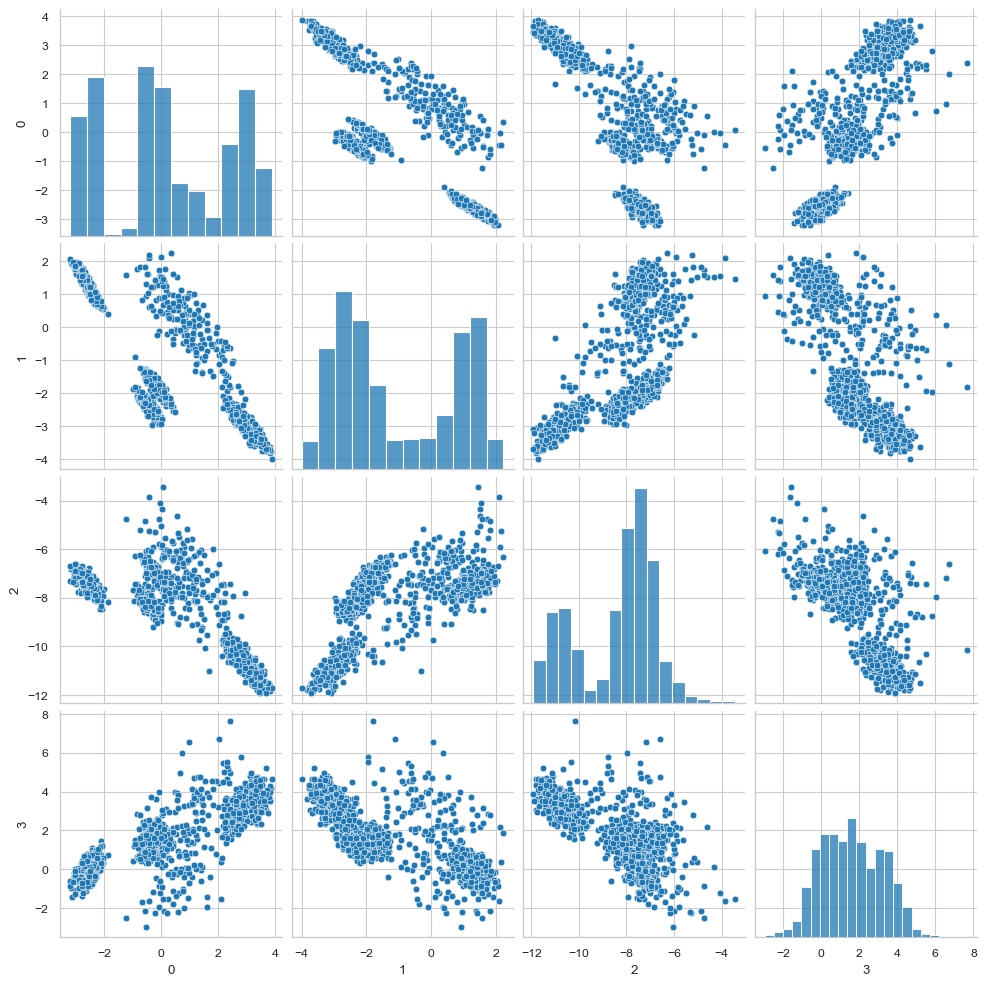

In [46]:
factor_scores = factor_analysis.transform(data)
sns.pairplot(pd.DataFrame(factor_scores))
plt.plot()

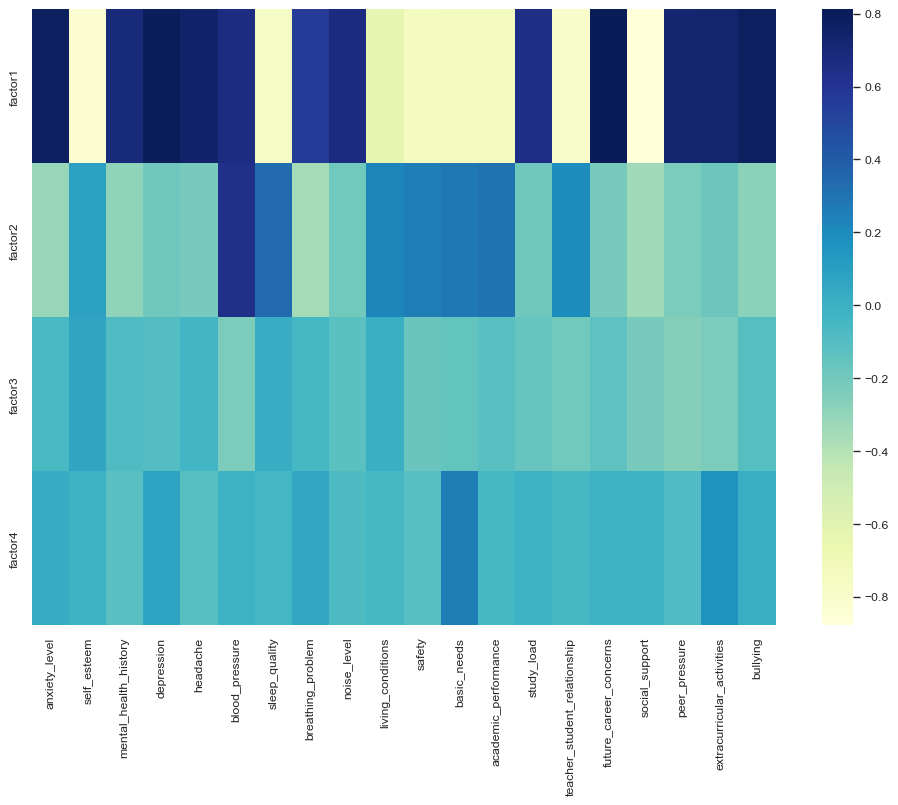

In [47]:
plt.figure(figsize=(12, 8))

sns.heatmap(factor_analysis.components_,
            cmap='YlGnBu',
            yticklabels=["factor" + str(x) for x in range(1, 5)],
            xticklabels=data.columns.tolist(),
            cbar_kws={"orientation": "vertical"}
            )
plt.show()

### 6 Factors

In [48]:
factor_analysis = FactorAnalysis(6, random_state=13)

In [49]:
factor_analysis.fit(data)

FactorAnalysis(n_components=6, random_state=13)

In [50]:
factor_analysis.components_

array([[ 5.03460826, -8.22451117,  0.34575319,  6.78553479,  1.02887885,
         0.48118373, -1.19078451,  0.81591955,  0.87398514, -0.69573663,
        -1.03060061, -1.02592567, -1.02831085,  0.87009116, -1.06074165,
         1.23666062, -0.82275657,  1.01212595,  1.03652784,  1.16137249],
       [-1.7941676 , -2.44378695, -0.07221975, -2.60801506, -0.15834664,
         0.36630712,  0.28268609, -0.25611914, -0.1182508 ,  0.0948586 ,
         0.11985608,  0.12511392,  0.17263642, -0.14634104,  0.12067147,
        -0.13824242, -0.29435293, -0.18761648, -0.11936678, -0.23602902],
       [-1.0262895 ,  2.06953671, -0.04156347,  1.4796678 ,  0.0148256 ,
         0.45199344,  0.12856794, -0.21625455, -0.04260849,  0.08177555,
         0.07193358,  0.09477688,  0.11832049, -0.02043166, -0.05744568,
        -0.0482196 , -0.42617062, -0.02647501, -0.011161  , -0.05233208],
       [ 2.49937345,  1.00131261,  0.03549662, -1.88321444,  0.09027599,
         0.10300073, -0.13227518,  0.08505724,  

In [51]:
factor_analysis.noise_variance_

array([0.99712562, 0.99460699, 0.11019145, 1.00205196, 0.77797594,
       0.04271165, 0.73806081, 1.08736526, 0.87723589, 0.69405124,
       0.67974743, 0.75880114, 0.70026107, 0.89816669, 0.55600059,
       0.64743787, 0.04201491, 0.69126164, 0.77770553, 0.67195193])

In [52]:
factor_df = pd.DataFrame(
    factor_analysis.components_.T, 
    columns=['factor_' + str(i) for i in range(factor_analysis.components_.shape[0])], 
    index=list(data.columns)
)

factor_df

,factor_0,factor_1,factor_2,factor_3,factor_4,factor_5
anxiety_level,5.034608,-1.794168,-1.026289,2.499373,-0.615024,0.385589
self_esteem,-8.224511,-2.443787,2.069537,1.001313,0.123950,-0.151612
mental_health_history,0.345753,-0.072220,-0.041563,0.035497,0.038892,-0.100622
depression,6.785535,-2.608015,1.479668,-1.883214,-0.150489,0.215876
headache,1.028879,-0.158347,0.014826,0.090276,0.189429,-0.282044
blood_pressure,0.481184,0.366307,0.451993,0.103001,-0.255314,-0.078365
sleep_quality,-1.190785,0.282686,0.128568,-0.132275,-0.228357,0.275532
breathing_problem,0.815920,-0.256119,-0.216255,0.085057,0.151224,-0.254557
noise_level,0.873985,-0.118251,-0.042608,0.162736,0.025188,-0.283850
living_conditions,-0.695737,0.094859,0.081776,-0.110458,-0.129234,0.168585


[]

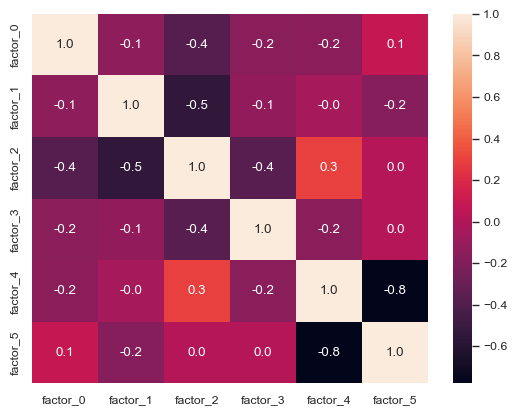

In [53]:
sns.heatmap(factor_df.corr(), annot=True, fmt=".1f")
plt.plot()

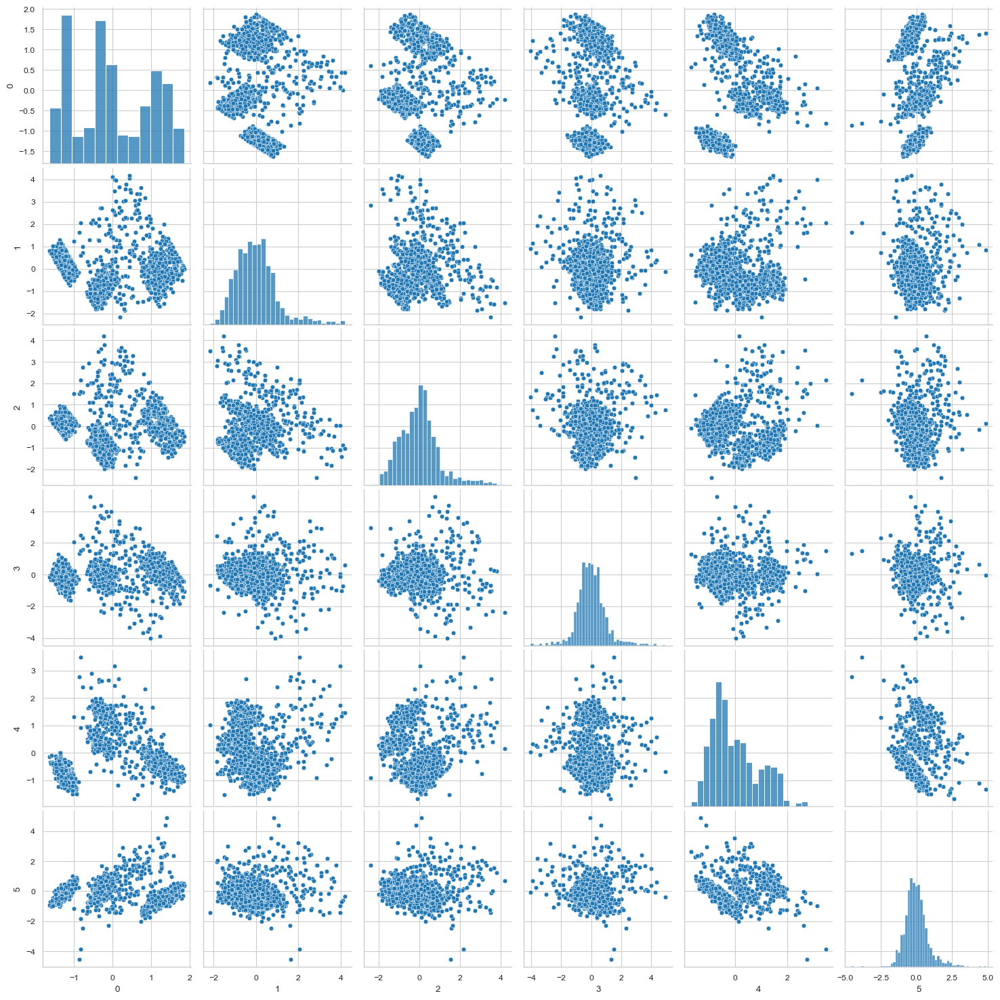

In [54]:
factor_scores = factor_analysis.transform(data)
sns.pairplot(pd.DataFrame(factor_scores))

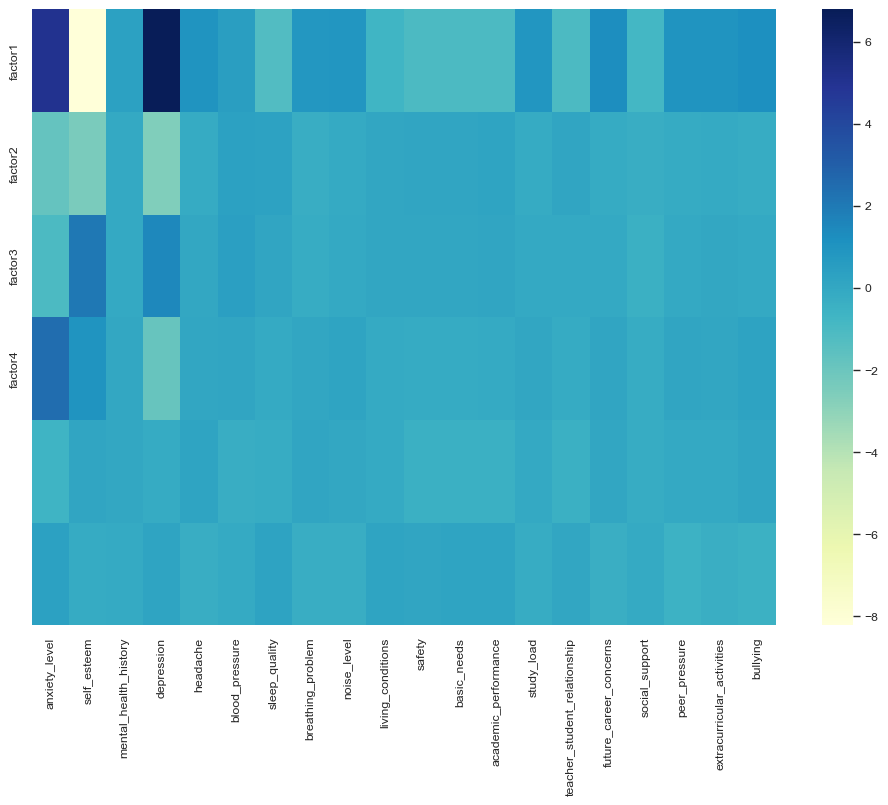

In [55]:
plt.figure(figsize=(12, 8))

sns.heatmap(factor_analysis.components_,
            cmap='YlGnBu',
            yticklabels=["factor" + str(x) for x in range(1, 5)],
            xticklabels=data.columns.tolist(),
            cbar_kws={"orientation": "vertical"}
            )
plt.show()

### 6 Factors with Standardization

In [56]:
factor_analysis = FactorAnalysis(6, random_state=13)

In [57]:
factor_analysis.fit(scaled_data)

FactorAnalysis(n_components=6, random_state=13)

In [58]:
factor_analysis.components_

array([[ 0.78440114, -0.8305784 ,  0.69082849,  0.80517506,  0.74934541,
         0.65702213, -0.76856135,  0.57135921,  0.67202686, -0.62910343,
        -0.75381534, -0.7441599 , -0.73934486,  0.65460396, -0.79890468,
         0.81500026, -0.87219692,  0.72644875,  0.73596704,  0.78622934],
       [-0.29849517,  0.07295473, -0.27751267, -0.17493875, -0.20917883,
         0.6490237 ,  0.31882027, -0.34589228, -0.18537956,  0.21886156,
         0.24583126,  0.27377915,  0.29700675, -0.17790733,  0.1849872 ,
        -0.20847813, -0.35410527, -0.22333211, -0.1693797 , -0.27089614],
       [-0.06077096,  0.06377921, -0.08431262, -0.09742173, -0.03451976,
        -0.23228585,  0.02359996, -0.05605206, -0.12359702,  0.01525916,
        -0.17108034, -0.16353109, -0.11504484, -0.15865137, -0.19677652,
        -0.1338461 , -0.22529101, -0.26153926, -0.23725964, -0.10657089],
       [ 0.04788143, -0.01048271, -0.05938033,  0.05208593, -0.05763477,
        -0.02345668, -0.06011392,  0.01643002, -

In [59]:
factor_analysis.noise_variance_

array([0.28820061, 0.25293977, 0.42159936, 0.29633031, 0.35301472,
       0.09528846, 0.29518382, 0.51485755, 0.48143099, 0.54971837,
       0.31950462, 0.24185793, 0.34857534, 0.51042554, 0.27484197,
       0.2715109 , 0.06450629, 0.33172452, 0.34853245, 0.25880628])

In [60]:
factor_df = pd.DataFrame(
    factor_analysis.components_.T, 
    columns=['factor_' + str(i) for i in range(factor_analysis.components_.shape[0])], 
    index=list(data.columns)
)

factor_df

,factor_0,factor_1,factor_2,factor_3,factor_4,factor_5
anxiety_level,0.784401,-0.298495,-0.060771,0.047881,0.029592,0.006417
self_esteem,-0.830578,0.072955,0.063779,-0.010483,0.144440,0.157848
mental_health_history,0.690828,-0.277513,-0.084313,-0.059380,-0.077160,0.012102
depression,0.805175,-0.174939,-0.097422,0.052086,-0.116925,0.050825
headache,0.749345,-0.209179,-0.034520,-0.057635,-0.151244,0.095104
blood_pressure,0.657022,0.649024,-0.232286,-0.023457,0.011552,-0.001257
sleep_quality,-0.768561,0.318820,0.023600,-0.060114,-0.006850,-0.084307
breathing_problem,0.571359,-0.345892,-0.056052,0.016430,0.121954,-0.119328
noise_level,0.672027,-0.185380,-0.123597,-0.066233,0.074208,-0.029891
living_conditions,-0.629103,0.218862,0.015259,-0.097273,0.011790,0.091799


[]

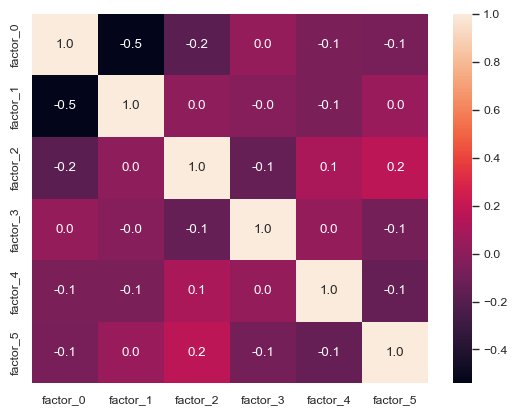

In [61]:
sns.heatmap(factor_df.corr(), annot=True, fmt=".1f")
plt.plot()

D:\Work\Uni\FMI-multivariate-statistical-modeling\Stress-Factors\venv\lib\site-packages\sklearn\base.py:458: UserWarning: X has feature names, but FactorAnalysis was fitted without feature names
  warnings.warn(


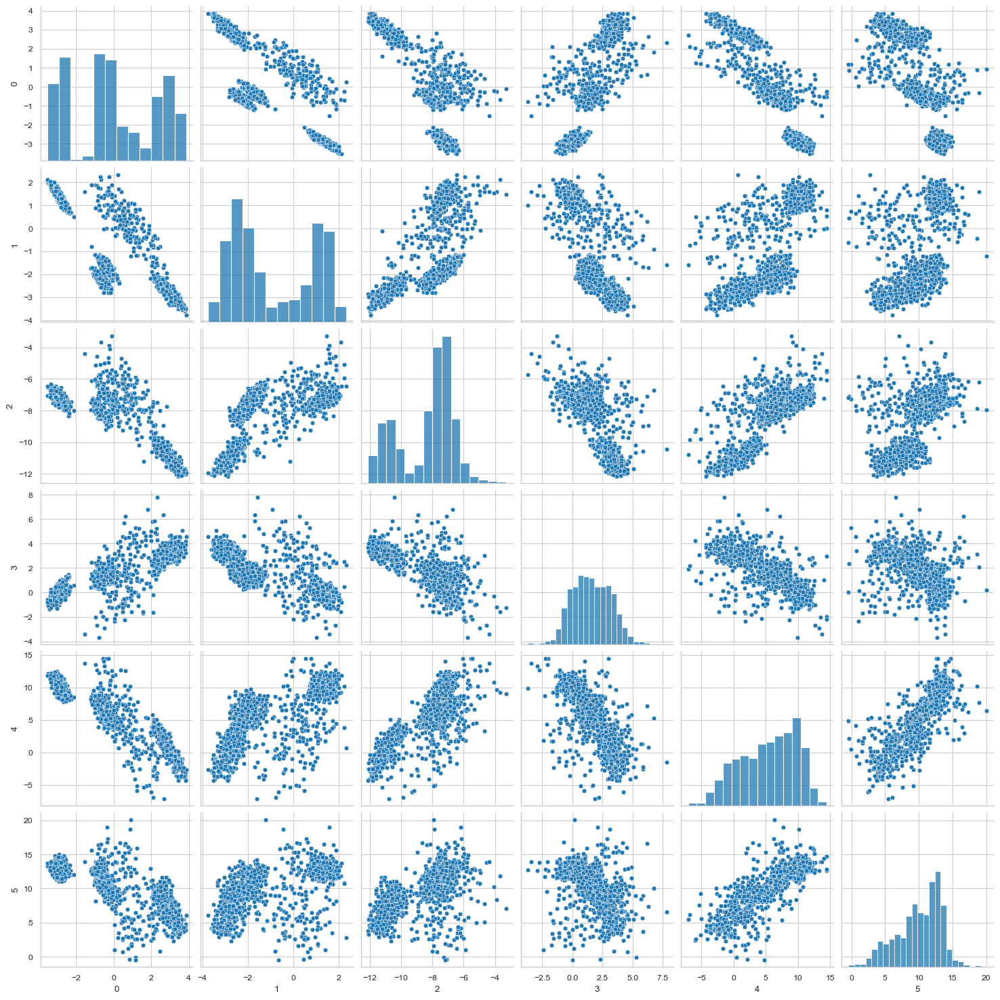

In [62]:
factor_scores = factor_analysis.transform(data)
sns.pairplot(pd.DataFrame(factor_scores))

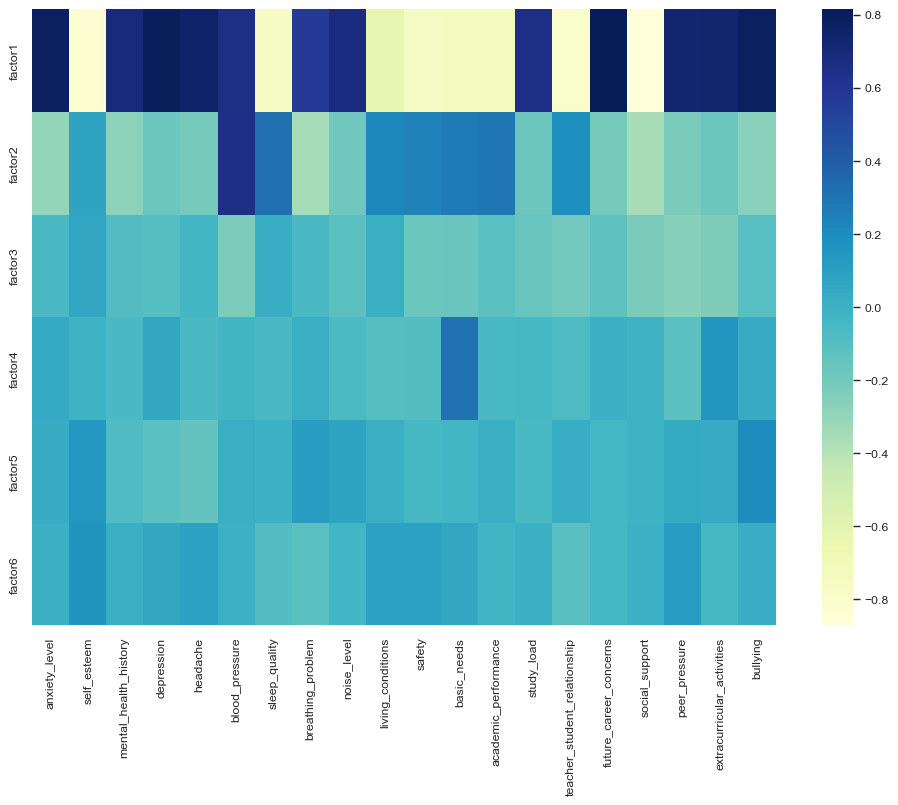

In [63]:
plt.figure(figsize=(12, 8))

sns.heatmap(factor_analysis.components_,
            cmap='YlGnBu',
            yticklabels=["factor" + str(x) for x in range(1, 7)],
            xticklabels=data.columns.tolist(),
            cbar_kws={"orientation": "vertical"}
            )
plt.show()

### 7 Factors with Standardization

In [64]:
factor_analysis = FactorAnalysis(7, random_state=13)

In [65]:
factor_analysis.fit(scaled_data)

FactorAnalysis(n_components=7, random_state=13)

In [66]:
factor_analysis.components_

array([[ 0.78619868, -0.82965473,  0.69244734,  0.8070285 ,  0.75098047,
         0.65256793, -0.77087577,  0.57342683,  0.67325623, -0.63095466,
        -0.75688593, -0.74635609, -0.74118188,  0.65612453, -0.80030076,
         0.81630171, -0.86979018,  0.72967528,  0.73673948,  0.7885702 ],
       [-0.29283582,  0.06649154, -0.27261176, -0.17018777, -0.20429304,
         0.65243857,  0.3139317 , -0.34169586, -0.18112448,  0.21530703,
         0.24245115,  0.26900988,  0.29141313, -0.17420913,  0.17887472,
        -0.20315506, -0.36093722, -0.22171859, -0.16444143, -0.26659116],
       [-0.05970261,  0.06038305, -0.08119804, -0.0977264 , -0.03501919,
        -0.23391821,  0.02441976, -0.05506287, -0.12048859,  0.01044615,
        -0.17879268, -0.16429836, -0.11605128, -0.16160044, -0.19627418,
        -0.13227488, -0.22382786, -0.27411004, -0.23261812, -0.10605924],
       [ 0.04758555, -0.03147973, -0.09175945,  0.05012936, -0.08243286,
        -0.02490059, -0.08156338,  0.06418806, -

In [67]:
factor_analysis.noise_variance_

array([0.28773124, 0.2673465 , 0.42147102, 0.27974218, 0.34680593,
       0.09578891, 0.29007203, 0.51638746, 0.48107568, 0.52766807,
       0.2899225 , 0.2344978 , 0.34510293, 0.49051636, 0.27059066,
       0.26993759, 0.06429124, 0.29933341, 0.35199796, 0.25045218])

In [68]:
factor_df = pd.DataFrame(
    factor_analysis.components_.T, 
    columns=['factor_' + str(i) for i in range(factor_analysis.components_.shape[0])], 
    index=list(data.columns)
)

factor_df

,factor_0,factor_1,factor_2,factor_3,factor_4,factor_5,factor_6
anxiety_level,0.786199,-0.292836,-0.059703,0.047586,0.023450,-0.013709,0.057092
self_esteem,-0.829655,0.066492,0.060383,-0.031480,0.109422,0.147569,-0.021976
mental_health_history,0.692447,-0.272612,-0.081198,-0.091759,-0.073856,-0.014323,0.065011
depression,0.807028,-0.170188,-0.097726,0.050129,-0.128288,-0.017553,0.048635
headache,0.750980,-0.204293,-0.035019,-0.082433,-0.171234,0.077440,-0.075360
blood_pressure,0.652568,0.652439,-0.233918,-0.024901,0.013618,-0.010522,-0.007378
sleep_quality,-0.770876,0.313932,0.024420,-0.081563,0.012277,-0.106883,-0.024881
breathing_problem,0.573427,-0.341696,-0.055063,0.064188,0.126872,-0.097151,0.025147
noise_level,0.673256,-0.181124,-0.120489,-0.097338,0.074422,-0.033012,-0.035616
living_conditions,-0.630955,0.215307,0.010446,-0.066728,-0.001132,0.089850,0.115447


[]

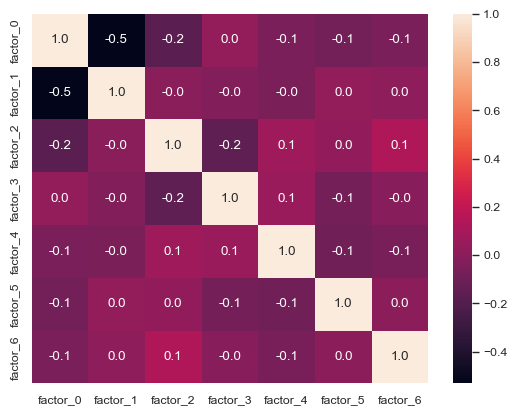

In [69]:
sns.heatmap(factor_df.corr(), annot=True, fmt=".1f")
plt.plot()

D:\Work\Uni\FMI-multivariate-statistical-modeling\Stress-Factors\venv\lib\site-packages\sklearn\base.py:458: UserWarning: X has feature names, but FactorAnalysis was fitted without feature names
  warnings.warn(


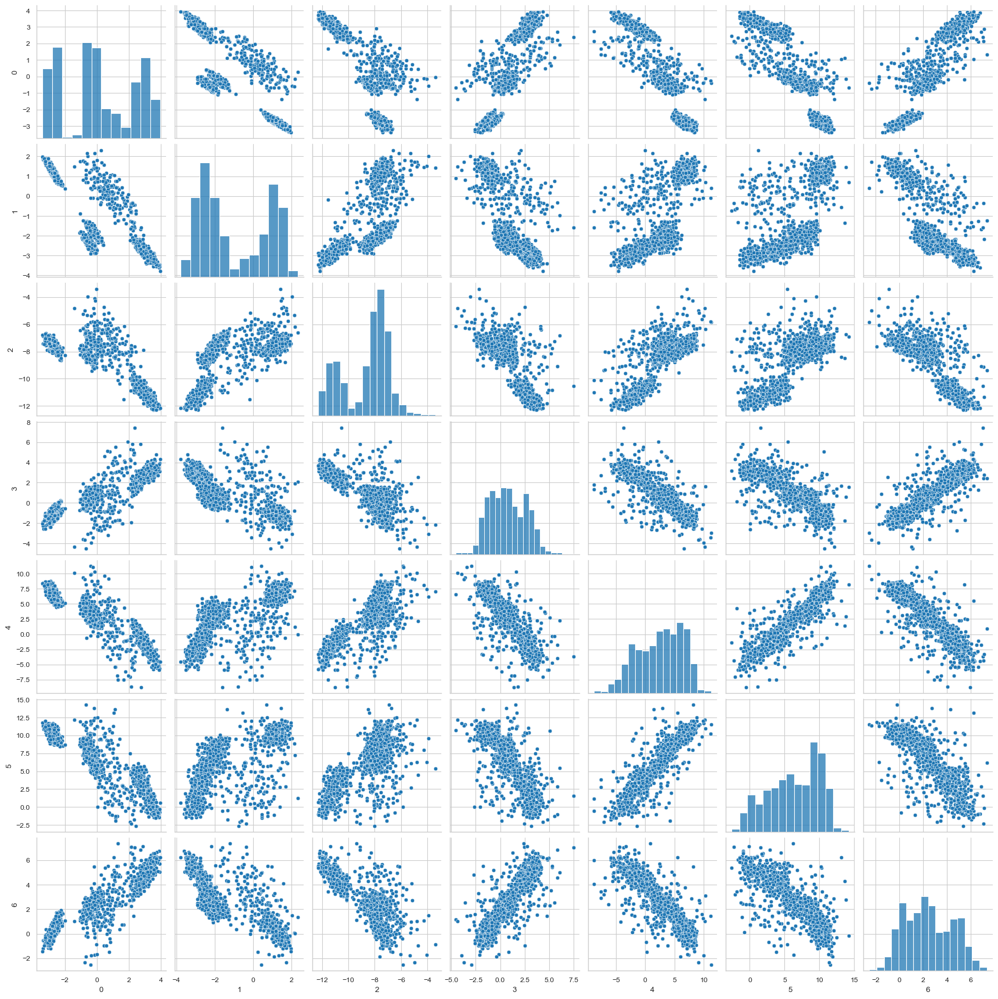

In [70]:
factor_scores = factor_analysis.transform(data)
sns.pairplot(pd.DataFrame(factor_scores))

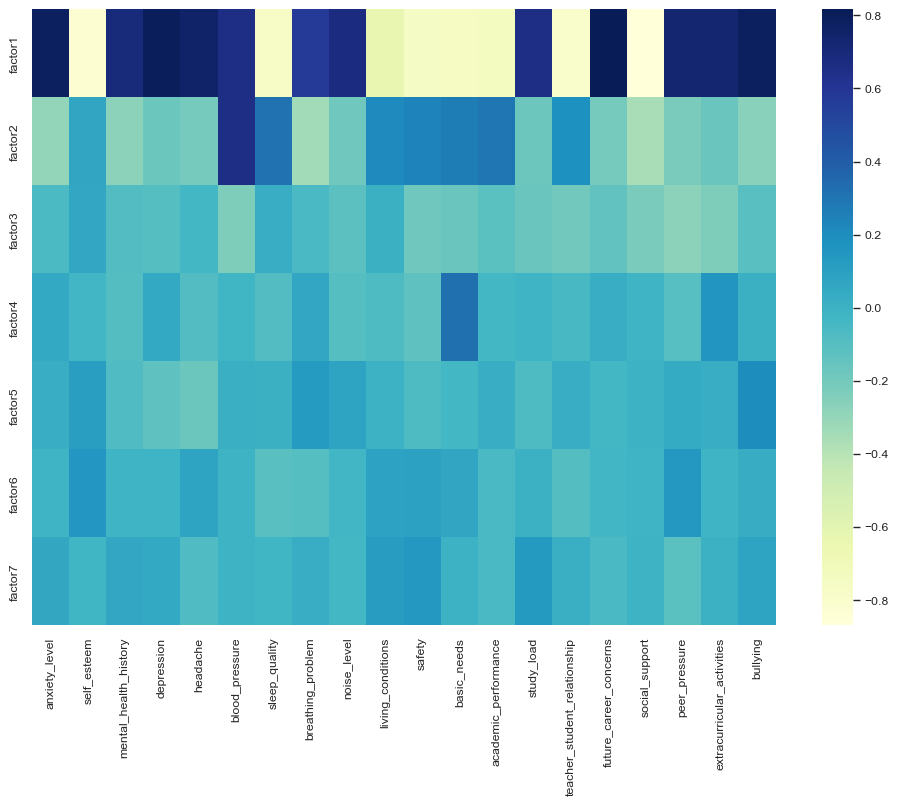

In [71]:
plt.figure(figsize=(12, 8))

sns.heatmap(factor_analysis.components_,
            cmap='YlGnBu',
            yticklabels=["factor" + str(x) for x in range(1, 8)],
            xticklabels=data.columns.tolist(),
            cbar_kws={"orientation": "vertical"}
            )
plt.show()

### 10 Factors with Standardization

In [72]:
factor_analysis = FactorAnalysis(10, random_state=13)

In [73]:
factor_analysis.fit(scaled_data)

FactorAnalysis(n_components=10, random_state=13)

In [74]:
factor_analysis.components_

array([[ 7.18733296e-01, -7.98906387e-01,  6.29535857e-01,
         7.57943894e-01,  7.05733337e-01,  7.56439938e-01,
        -7.00568867e-01,  5.01289654e-01,  6.27917675e-01,
        -5.80045709e-01, -7.03524550e-01, -6.93623238e-01,
        -6.82996575e-01,  6.09225858e-01, -7.58305744e-01,
         7.61135730e-01, -9.35344213e-01,  6.69019641e-01,
         6.86591615e-01,  7.28427101e-01],
       [-4.20968674e-01,  2.09943252e-01, -3.84386762e-01,
        -3.04213455e-01, -3.44676614e-01,  5.58879757e-01,
         4.39970089e-01, -4.28032406e-01, -2.93945629e-01,
         3.19276223e-01,  3.76530173e-01,  4.12078294e-01,
         4.31767131e-01, -2.80232804e-01,  3.26473085e-01,
        -3.36757735e-01, -1.93727351e-01, -3.28761988e-01,
        -2.77990255e-01, -4.00512364e-01],
       [-1.00445683e-01,  1.03737671e-01, -1.27611557e-01,
        -1.35447189e-01, -8.41312028e-02, -2.60816404e-01,
         7.05366321e-02, -9.30685923e-02, -1.64542823e-01,
         5.61285606e-02, -1.1

In [75]:
factor_analysis.noise_variance_

array([0.27926802, 0.25411915, 0.42552657, 0.27521245, 0.21909366,
       0.04642003, 0.28679699, 0.52924125, 0.3717947 , 0.52136719,
       0.30947332, 0.1814796 , 0.25154015, 0.47028474, 0.27847302,
       0.25699576, 0.0294364 , 0.32005552, 0.35296853, 0.18345285])

In [76]:
factor_df = pd.DataFrame(
    factor_analysis.components_.T, 
    columns=['factor_' + str(i) for i in range(factor_analysis.components_.shape[0])], 
    index=list(data.columns)
)

factor_df

,factor_0,factor_1,factor_2,factor_3,factor_4,factor_5,factor_6,factor_7,factor_8,factor_9
anxiety_level,0.718733,-0.420969,-0.100446,0.071660,0.022774,-0.062706,-0.057016,0.005378,-0.054166,-0.032249
self_esteem,-0.798906,0.209943,0.103738,-0.012242,0.042103,0.177513,-0.127486,0.040039,-0.010269,0.036604
mental_health_history,0.629536,-0.384387,-0.127612,-0.059560,-0.035627,0.011628,0.033051,-0.007846,-0.085717,-0.025336
depression,0.757944,-0.304213,-0.135447,0.058773,-0.098362,-0.073391,0.031493,0.024659,-0.138360,0.012565
headache,0.705733,-0.344677,-0.084131,-0.149447,-0.326300,0.145942,-0.058329,-0.025659,0.036759,-0.042065
blood_pressure,0.756440,0.558880,-0.260816,-0.022662,0.011693,0.004174,0.017841,-0.000630,0.008178,0.008243
sleep_quality,-0.700569,0.439970,0.070537,-0.095667,0.018081,0.009924,0.010992,-0.074747,0.037531,-0.084565
breathing_problem,0.501290,-0.428032,-0.093069,0.076124,0.103740,-0.063231,-0.019133,-0.065171,0.038396,-0.030726
noise_level,0.627918,-0.293946,-0.164543,-0.086483,0.073391,-0.128438,-0.203295,0.184738,0.101048,-0.072861
living_conditions,-0.580046,0.319276,0.056129,-0.053852,0.042388,0.050780,0.042506,0.147648,-0.078710,0.000812


[]

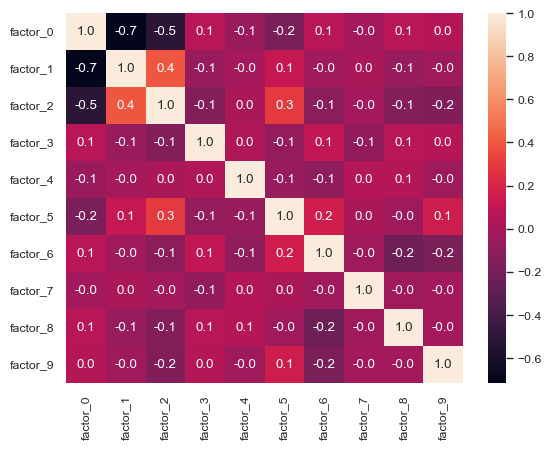

In [77]:
sns.heatmap(factor_df.corr(), annot=True, fmt=".1f")
plt.plot()

D:\Work\Uni\FMI-multivariate-statistical-modeling\Stress-Factors\venv\lib\site-packages\sklearn\base.py:458: UserWarning: X has feature names, but FactorAnalysis was fitted without feature names
  warnings.warn(


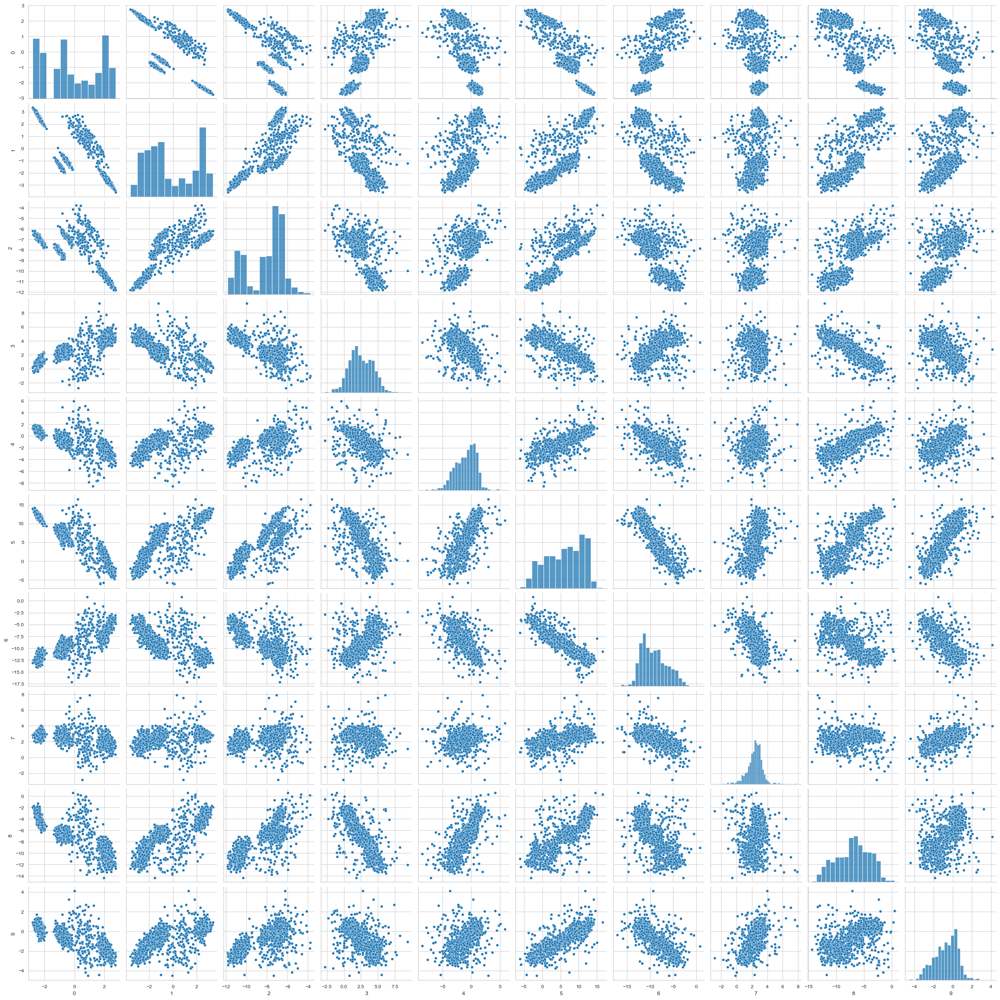

In [78]:
factor_scores = factor_analysis.transform(data)
sns.pairplot(pd.DataFrame(factor_scores))

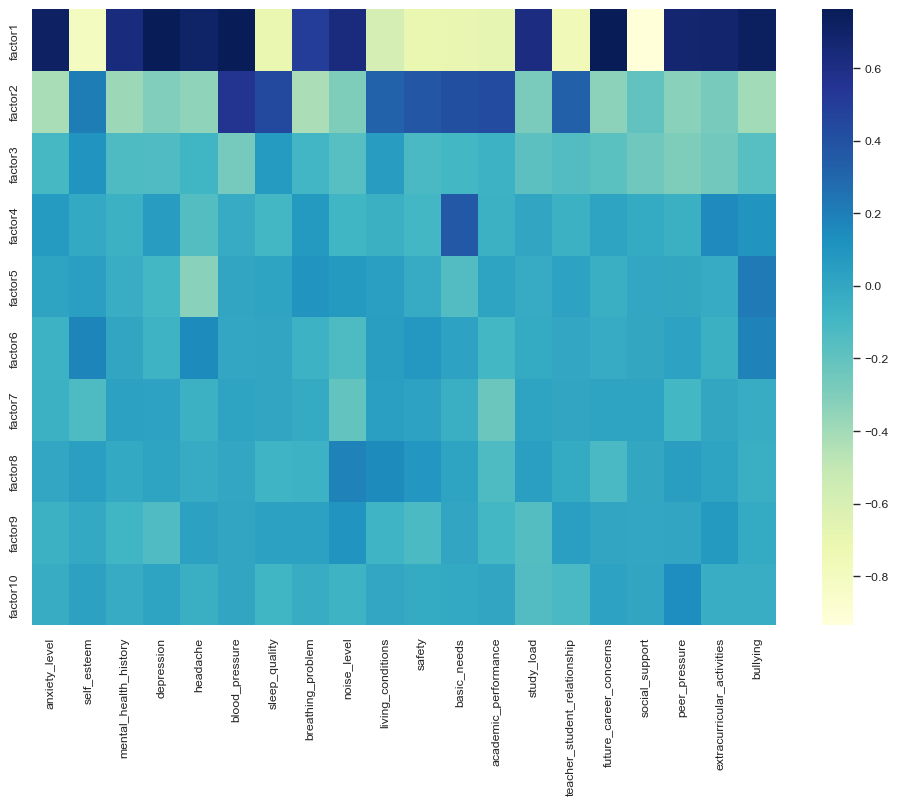

In [79]:
plt.figure(figsize=(12, 8))

sns.heatmap(factor_analysis.components_,
            cmap='YlGnBu',
            yticklabels=["factor" + str(x) for x in range(1, 11)],
            xticklabels=data.columns.tolist(),
            cbar_kws={"orientation": "vertical"}
            )
plt.show()

### Scree Plot

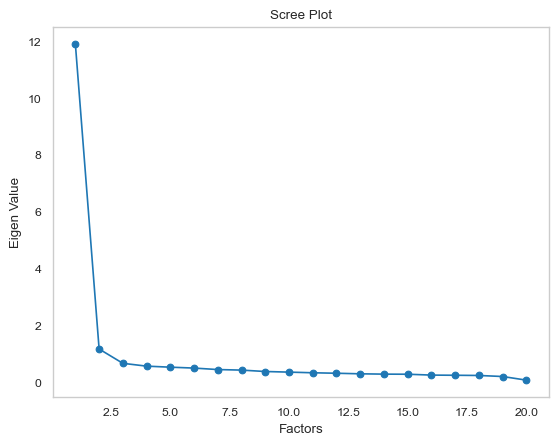

In [80]:
fa = FactorAnalyzer(rotation = None, impute = "drop", n_factors=data.shape[1])
fa.fit(data)
ev,_ = fa.get_eigenvalues()
plt.scatter(range(1,data.shape[1]+1),ev)
plt.plot(range(1,data.shape[1]+1),ev)
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigen Value')
plt.grid()

### 2 Factors with Standardization 

In [81]:
factor_analysis = FactorAnalysis(2, random_state=13)

In [82]:
factor_analysis.fit(scaled_data)

FactorAnalysis(n_components=2, random_state=13)

In [83]:
factor_analysis.components_

array([[-0.48544796,  0.64212771, -0.43154046, -0.5746791 , -0.49876748,
        -0.97197627,  0.45622128, -0.29194474, -0.47121841,  0.3961753 ,
         0.43761605,  0.42769009,  0.41529818, -0.46442563,  0.49955389,
        -0.57681937,  0.82779859, -0.52742786, -0.54934696, -0.51689196],
       [-0.68738417,  0.53215945, -0.60636941, -0.59691644, -0.59642145,
         0.20526034,  0.69721148, -0.59436744, -0.51711747,  0.53757308,
         0.65665112,  0.65059001,  0.68024355, -0.5022405 ,  0.6376908 ,
        -0.62004398,  0.25866085, -0.55392104, -0.53171095, -0.64907435]])

In [84]:
factor_analysis.noise_variance_

array([0.29184279, 0.30447751, 0.44608845, 0.31343279, 0.39551596,
       0.01318631, 0.30575615, 0.56149546, 0.51054312, 0.55405867,
       0.37730257, 0.39381576, 0.36479069, 0.53206475, 0.3437986 ,
       0.28282736, 0.24783279, 0.41498937, 0.41550449, 0.31152265])

In [85]:
factor_df = pd.DataFrame(
    factor_analysis.components_.T, 
    columns=['factor_' + str(i) for i in range(factor_analysis.components_.shape[0])], 
    index=list(data.columns)
)

factor_df

,factor_0,factor_1
anxiety_level,-0.485448,-0.687384
self_esteem,0.642128,0.532159
mental_health_history,-0.431540,-0.606369
depression,-0.574679,-0.596916
headache,-0.498767,-0.596421
blood_pressure,-0.971976,0.205260
sleep_quality,0.456221,0.697211
breathing_problem,-0.291945,-0.594367
noise_level,-0.471218,-0.517117
living_conditions,0.396175,0.537573


[]

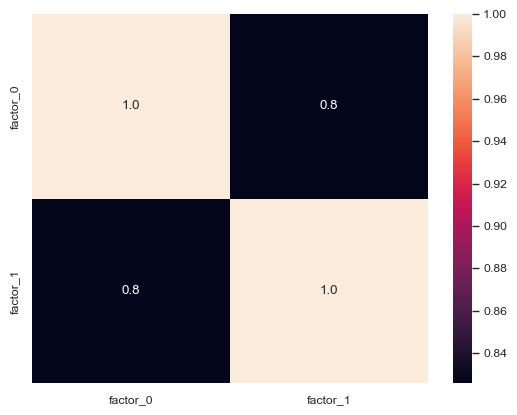

In [86]:
sns.heatmap(factor_df.corr(), annot=True, fmt=".1f")
plt.plot()

D:\Work\Uni\FMI-multivariate-statistical-modeling\Stress-Factors\venv\lib\site-packages\sklearn\base.py:458: UserWarning: X has feature names, but FactorAnalysis was fitted without feature names
  warnings.warn(


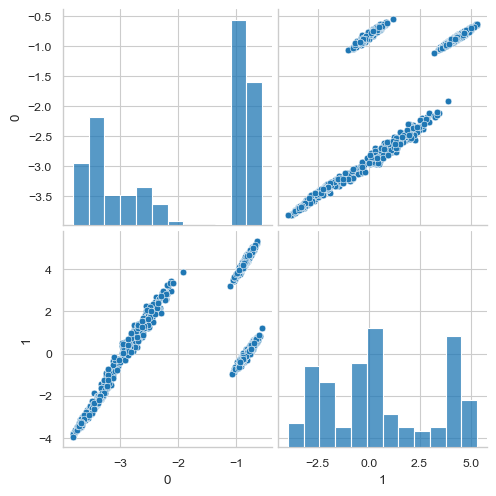

In [87]:
factor_scores = factor_analysis.transform(data)
sns.pairplot(pd.DataFrame(factor_scores))

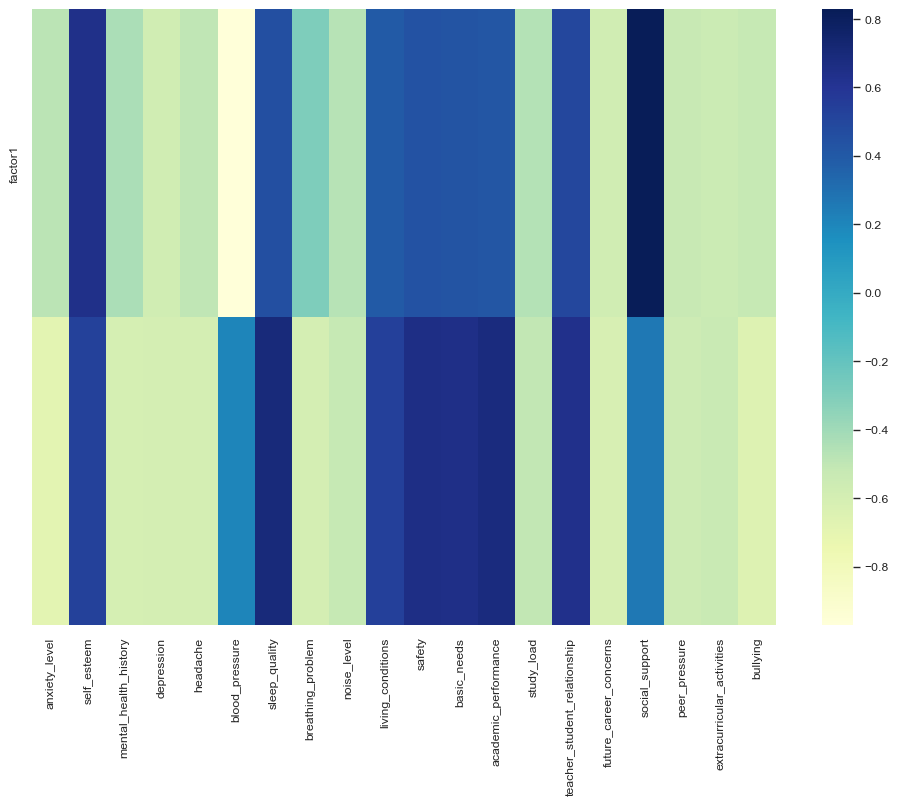

In [88]:
plt.figure(figsize=(12, 8))

sns.heatmap(factor_analysis.components_,
            cmap='YlGnBu',
            yticklabels=["factor" + str(x) for x in range(1, 2)],
            xticklabels=data.columns.tolist(),
            cbar_kws={"orientation": "vertical"}
            )
plt.show()

## PCA

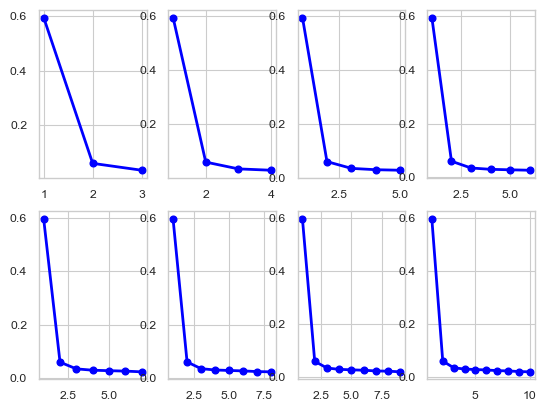

In [89]:
figure, axis = plt.subplots(2, 4) 

for i in range(3, 11):
    pca = PCA(n_components=i)
    components = pca.fit_transform(scaled_data)
    
    PC_values = np.arange(pca.n_components_) + 1
    axis[(i-3) // 4, (i-3) % 4].plot(
        PC_values, 
        pca.explained_variance_ratio_, 
        'o-', 
        linewidth=2, 
        color='blue'
    )

In [90]:
pca = PCA(n_components=2)
components = pca.fit_transform(scaled_data)

In [91]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

fig = px.scatter(components, x=0, y=1, color=stress)

for i, feature in enumerate(data.columns.tolist()):
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        axref="x", ayref="y",
        showarrow=True,
        arrowsize=2,
        arrowhead=2,
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
        yshift=5,
    )

fig.update_layout(
    autosize=True
)
fig.show()

In [92]:
px.area(
    x=range(1, np.cumsum(pca.explained_variance_ratio_).shape[0] + 1),
    y=np.cumsum(pca.explained_variance_ratio_),
    labels={"x": "# Components", "y": "Explained Variance"}
)

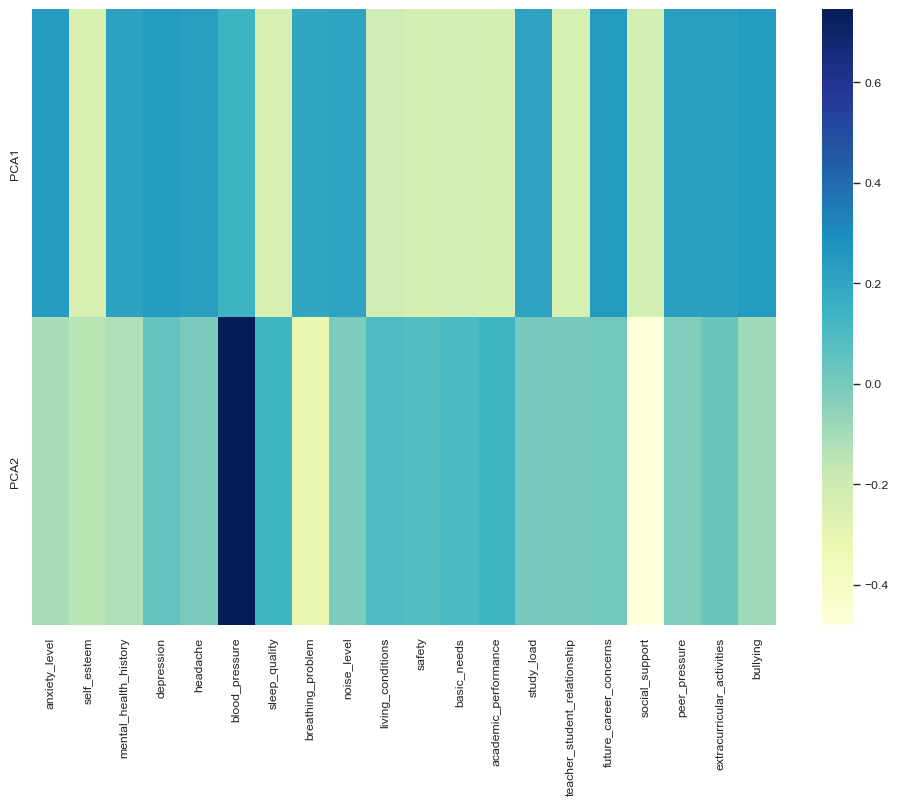

In [93]:
plt.figure(figsize=(12, 8))

sns.heatmap(pca.components_,
    cmap='YlGnBu',
    yticklabels=[ "PCA"+str(x) for x in range(1,pca.n_components_+1)],
    xticklabels=data.columns.tolist(),
    cbar_kws={"orientation": "vertical"}
)
plt.show()